<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Комментарий ревьюера</b>


Привет, Рустам! Давай знакомиться! Меня зовут Дмитрий Махортов, и я буду проверять твой проект. Сразу предлагаю общение на «ты» 🙂, но если тебе это не комфортно, то дай знать, и мы перейдем на «вы». 


Моя основная цель — не указать на совершенные тобою ошибки, а поделиться своим опытом и помочь тебе погрузиться в увлекательный мир работы с данными и вырасти в крепкого профи. Это отдаленная цель. А ближайшая - сделать твою работу еще лучше )).
   
    
Все ключевые этапы в работе выполнены, и я вижу что с проектом ты справшяешься. Есть моменты, которые нужно доработать, но я уверен, у тебя все получится.
        
Расскажу как обычно проходит проверка:    
Бывают моменты, которые требуют пристального внимания. Комментарии по ним выделены <span style='background-color:#F7B3A4'> красным цветом </span> и обозначены значком 🛑. После их доработки проект будет принят.  🙂
 
<span style='background-color:#B7EBA7'> Зеленым цветом </span> и значком ✅ отмечены удачные и элегантные решения, на которые можно опираться в будущих проектах. Или советы «со звездочкой», которые помогут тебе в будущем.

<span style='background-color:#F9EDA6'>Жёлтым цветом </span> и значком ⚠️ выделено то, что в следующий раз можно сделать по-другому. Ты можешь учесть эти комментарии при выполнении будущих заданий или доработать проект сейчас (однако это не обязательно).

Давай работать над проектом в диалоге: **если ты что-то меняешь в проекте по моим рекомендациям — пиши об этом**. Выбери для своих комментариев какой-то заметный цвет, так мне будет легче отследить изменения. Пожалуйста, **не перемещай, не изменяй и не удаляй мои комментарии**. Всё это поможет выполнить повторную проверку твоего проекта оперативнее. 
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>образец комментария студента</b></font>
   
Можешь использовать этот комментарий. Просто удали этот текст и вместо него напиши свой 🙂

</div>

In [95]:
import spacy
import warnings
from transformers import BertTokenizer, BertModel

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

import torch
import torch.nn as nn
import torch.optim as optim
from PIL import Image
from torchvision import transforms, models

from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import StandardScaler

from sklearn.dummy import DummyRegressor

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично, все нужные библиотеки импортированы в начале ноутбука.Это хорошая практика.</div>

In [96]:
pd.set_option('display.float_format', '{:,.2f}'.format)
warnings.filterwarnings('ignore')

In [97]:
RANDOM_STATE = 2024
DATA_PATH = 'dataset'

In [98]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

# Введение

Разработка демонстрационной версии поиска изображений по запросу

В рамках проекта разработана демонстрационная версия системы поиска изображений на основе текстовых запросов. Для реализации данной системы была обучена модель, которая преобразует изображения и текстовые запросы в векторные представления и оценивает степень их соответствия по шкале от 0 до 1.

Цели и задачи:
1. Разработка системы, способной преобразовывать изображения и текст в векторные представления.
2. Обучение модели на основе выбранных архитектур нейронных сетей.
3. Оценка соответствия текстового запроса и изображения с помощью модели.

Ожидаемые результаты:
Система будет способна принимать текстовые запросы и выводить изображения, наиболее соответствующие этим запросам, с указанием степени их соответствия.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 Да, это хорошая практика - дать описание контекста и проблемы, которую мы решаем. </div>

# Исследовательский анализ данных

Данные можно загрузить <a href="https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip">тут</a>

In [99]:
def print_image_dir(path, count=4):
    # Поддерживаемые форматы изображений
    supported_formats = ('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff')

    # Получение списка файлов в папке с поддерживаемыми форматами
    image_files = [file for file in os.listdir(path) if file.lower().endswith(supported_formats)]

    print("Кол-во картинок", len(image_files))

    # Проверка, есть ли хотя бы 4 изображения
    if len(image_files) < count:
        print(f"В папке найдено только изображений.")
        selected_images = image_files
    else:
        selected_images = image_files[:count]

    # Отображение изображений
    plt.figure(figsize=(10, 10))  # Размер фигуры можно изменить по необходимости

    for idx, image_name in enumerate(selected_images, 1):
        image_path = os.path.join(path, image_name)
        try:
            img = Image.open(image_path)
            plt.subplot(1, 4, idx)  # Расположение в сетке 2x2
            plt.imshow(img)
            plt.title(image_name)
            plt.axis('off')
        except Exception as e:
            print(f"Не удалось открыть изображение {image_name}: {e}")

    plt.tight_layout()
    plt.show()

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

## Загрузка данных

In [100]:
train_dataset = pd.read_csv(os.path.join(DATA_PATH, 'train_dataset.csv'))
test_queries = pd.read_csv(os.path.join(DATA_PATH, 'test_queries.csv'), sep='|', index_col=0)
crowd_annotations = pd.read_csv(os.path.join(DATA_PATH, 'CrowdAnnotations.tsv'), sep='\t', header=None)
expert_annotations = pd.read_csv(os.path.join(DATA_PATH, 'ExpertAnnotations.tsv'), sep='\t', header=None)
test_images = pd.read_csv(os.path.join(DATA_PATH, 'test_images.csv'), sep='|')

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
Очень "больная тема" - это загрузка данных и использование путей.Очевидно, что на моей машине (и скорее всего машине любого другого пользователя) пути к данным будут другие. И это "рабочая ситуация для большинства проектов. Решается она следующим образом:
 
    
  - Путь к директории с данными  должен быть задан в константе, в самом начале работы. Тогда ревьюеру (или любому другому пользователю твоего ноутбука, даже тебе самому, если нужно будет провести презентацию руководителю на другом компьютере) нужно будет изменить только этот путь.
  - Все остальные пути внутри ноутбука должны быть созданы с исопользованием этой константы, а не заданы жестко (есть сленговое определение "хардкод").  Более  того, настоятельно рекомендую для создания сложных путей вместо простой конкатерации строк с исползованием '/' использовать os.path.join(), тогда код будет одинаково надежно работать и в среде Windows и Linux (MacOS).
   
Чтобы запустить твой код при проверке я был вынужден руками менять код по всему ноутбуку. Прошу тебя внести изменения так, чтобы путь к данным нужно было изменять всего один раз.


А вот это образец универсального кода для загрузки данных    
    
    DATA_PATH = твой путь    
    
    df_train = pd.read_csv(os.path.join(DATA_PATH, 'train_dataset.csv'))
    ....
    
    
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3">
        <b>Комментарий студента</b>
    </font>
    Вынес в отдельный параметр DATA_PATH
</div>

## Данные для обучения

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

In [101]:
train_dataset.head()

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [8]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


In [9]:
print("Количество уникальных изображений в обучающем наборе", train_dataset.image.nunique())

Количество уникальных изображений в обучающем наборе 1000


In [10]:
print("Количество уникальных описаний в обучающем наборе", train_dataset.query_text.nunique())

Количество уникальных описаний в обучающем наборе 977


В папке `train_images` содержатся изображения для тренировки модели.

Кол-во картинок 1000


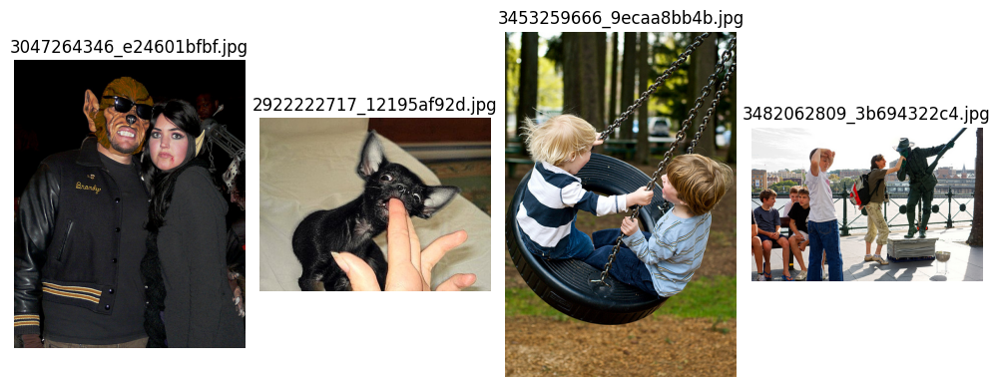

In [11]:
print_image_dir('dataset/train_images')

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

## Данные для тестирования

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

In [12]:
test_queries.head()

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


In [13]:
test_queries.info()

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


In [14]:
print("Количество уникальных изображений в тестовом наборе", test_queries.image.nunique())

Количество уникальных изображений в тестовом наборе 100


In [15]:
print("Количество уникальных описаний в тестовом наборе", test_queries.query_text.nunique())

Количество уникальных описаний в тестовом наборе 500


В папке `test_images` содержатся изображения для тестирования модели.

Кол-во картинок 100


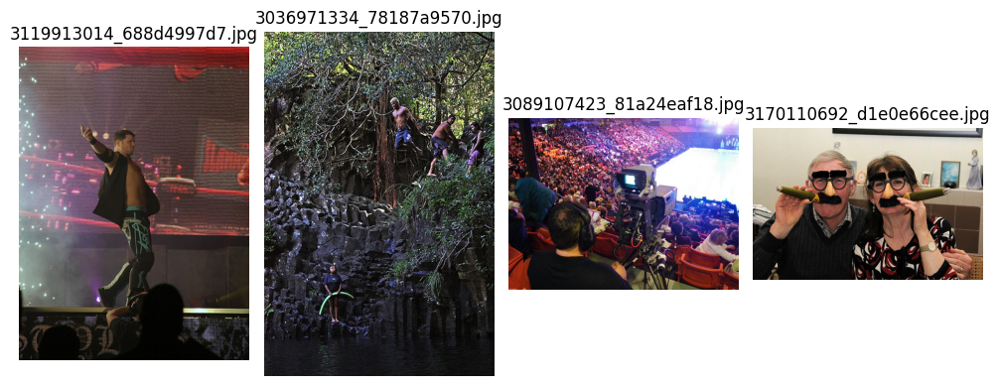

In [16]:
print_image_dir('dataset/test_images')

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

## Данные по соответствию изображения и описания

In [17]:
crowd_annotations.columns = ['image', 'query_id', 'conf_rate', 'confirm', 'not_confirm']

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.


In [18]:
crowd_annotations.head()

,image,query_id,conf_rate,confirm,not_confirm
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.00,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.00,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.00,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.00,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.00,0,3


In [19]:
crowd_annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        47830 non-null  object 
 1   query_id     47830 non-null  object 
 2   conf_rate    47830 non-null  float64
 3   confirm      47830 non-null  int64  
 4   not_confirm  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


In [20]:
print("Количество уникальных запросов в crowd_annotations:", crowd_annotations['query_id'].nunique())

Количество уникальных запросов в crowd_annotations: 1000


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

## Данные по соответствию изображения

In [21]:
expert_annotations.columns = ['image', 'query_id', 'exp_1', 'exp_2', 'exp_3']

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

In [22]:
expert_annotations.head()

,image,query_id,exp_1,exp_2,exp_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [23]:
expert_annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   exp_1     5822 non-null   int64 
 3   exp_2     5822 non-null   int64 
 4   exp_3     5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


In [24]:
print("Количество уникальных запросов в crowd_annotations:", expert_annotations['query_id'].nunique())

Количество уникальных запросов в crowd_annotations: 977


Следующим шагом добавляется обобщённая экспертная оценка. Сделаем медианную оценку всех экспертов для расчета агрегированной оценки экспертов. Приведем целевую переменную - оценки, в диапазон [0,1], используя масштабирование min-max.

In [25]:
expert_annotations['exp_total'] = (expert_annotations[['exp_1', 'exp_2', 'exp_3']]).median(axis=1)
# применим методы нормализации по столбцу 'exp_total'
expert_annotations['exp_norm'] = (expert_annotations['exp_total'] - expert_annotations['exp_total'].min()) / (
        expert_annotations['exp_total'].max() - expert_annotations['exp_total'].min())

In [26]:
expert_annotations.head()

,image,query_id,exp_1,exp_2,exp_3,exp_total,exp_norm
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1.00,0.00
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1.00,0.00
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,1.00,0.00
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,2.00,0.33
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,1.00,0.00


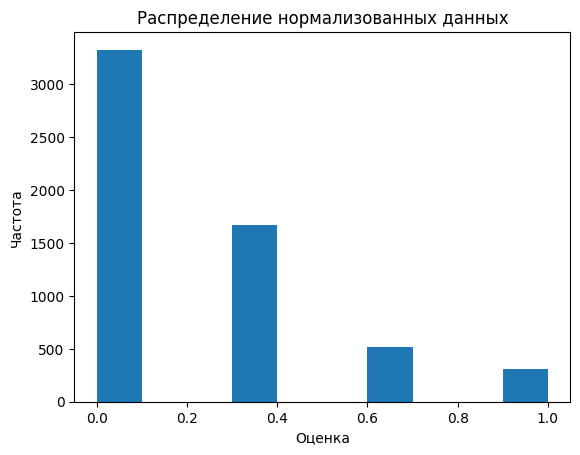

In [27]:
# просмотрим нормализованные данные
expert_annotations['exp_norm'].plot.hist()
plt.title('Распределение нормализованных данных')
plt.xlabel('Оценка')
plt.ylabel('Частота')
plt.show();

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

## Объединение таблицы

In [28]:
train_data = train_dataset \
    .merge(expert_annotations[['image', 'query_id', 'exp_norm']], how='left', on=['image', 'query_id']) \
    .merge(crowd_annotations[['image', 'query_id', 'conf_rate']], how='outer', on=['image', 'query_id'])

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">

По объединению экспертных и крауд оценок все ОК, но подсвечу возможные альтернативы
    
--------------    
    
    
В этом проекте есть несколько возможных стратегий работы с обучающими и краудсорс оценками,  вот эти стратегии с плюсами и минусами:
   

   - использовать соединение через outer, в этом случае, при корректной обработке пропусков мы можем получить более 50К размеченых пар. К плюсам данного подхода можно отнести большое количество данных. Минус - в основном это будут данные, размеченные краудсорсерами, а там качество раметки ниже.
   - использовать только экспертные оценки. плюс - высокое качество данных (разметка имеет шкалу). Минус - данных меньше.  Поясню по поводу качества разметки на примере: если на изображении одна собака, а в описании "две собаки бегут по берегу", то эксперты поставять соответствие 0,6-0,7 (переводя в шкалу 0-1), а краудсорсеры поставят 0.  Но на экспертных оценках модель хотя-бы научится находить собак, а на краудсор оценках ничему не начится.

   - использование соединения через left.  Данный подход очевидно проигрывает второму варианту: данных столько же, нужно дополнительно возиться с объединением, но качество разметки снижается.. Но это соответсвует предложениям авторов проекта, поэтому такой подход имеет право на жизнь

   - объединение через inner. Тут все плохо - и данных ОЧЕНЬ мало (в два раза меньше, чем использовать только экспертные оценки) и качество у них "подпорчено". И навыков по обработке пропусков не получаем.....


</div>

In [29]:
train_data.sample(10, random_state=RANDOM_STATE)

,image,query_id,query_text,exp_norm,conf_rate
29610,3217187564_0ffd89dec1.jpg,2968182121_b3b491df85.jpg#2,Two greyhounds race .,0.67,0.33
42152,3613955682_3860e116cf.jpg,2913965136_2d00136697.jpg#2,NaN,NaN,0.00
3524,150387174_24825cf871.jpg,359837950_9e22ffe6c2.jpg#2,NaN,NaN,0.00
33835,3354883962_170d19bfe4.jpg,3223055565_68973f5d20.jpg#2,NaN,NaN,0.00
8611,2225231022_1632d0a5aa.jpg,410453140_5401bf659a.jpg#2,NaN,NaN,0.00
40209,3565598162_56044bc2f7.jpg,2078311270_f01c9eaf4c.jpg#2,NaN,NaN,0.00
41597,359837950_9e22ffe6c2.jpg,326456451_effadbbe49.jpg#2,NaN,NaN,0.33
44523,3741462565_cc35966b7a.jpg,2505988632_9541f15583.jpg#2,NaN,NaN,0.00
19931,2830869109_c4e403eae6.jpg,2856080862_95d793fa9d.jpg#2,NaN,NaN,0.00
42178,3613955682_3860e116cf.jpg,416960865_048fd3f294.jpg#2,NaN,NaN,0.00


In [30]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51323 non-null  object 
 1   query_id    51323 non-null  object 
 2   query_text  5822 non-null   object 
 3   exp_norm    5822 non-null   float64
 4   conf_rate   47830 non-null  float64
dtypes: float64(2), object(3)
memory usage: 2.0+ MB


## Проверка дубликатов

Извлекаем уникальные сочетания query_id и query_text из тренировочного набора данных. Уникальные описания помогают избежать дублирования, что может привести к искажению анализируемых данных и ухудшению качества модели.

In [31]:
query_id_text_corresp = train_dataset[['query_id', 'query_text']].drop_duplicates()
query_id_text_corresp.head()

,query_id,query_text
0,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
12,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...
22,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .
27,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...
31,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .


Соединяем набор данных train_data с уникальными описаниями с использованием query_id для обеспечения наличия всех необходимых текстов. Важно, чтобы каждое изображение имело связанный текст, который используется в дальнейших этапах обучения моделей машинного обучения.

In [32]:
train_data = train_data.drop(columns=['query_text']).merge(query_id_text_corresp, how="left", on=['query_id'])

In [33]:
train_data.head()

,image,query_id,exp_norm,conf_rate,query_text
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,NaN,1.00,"A woman is signaling is to traffic , as seen f..."
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,NaN,0.00,A boy in glasses is wearing a red shirt .
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,NaN,0.00,A young boy holds onto a blue handle on a pier .
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,NaN,0.00,"A woman wearing black clothes , a purple scarf..."
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,NaN,0.00,An older woman with blond hair rides a bicycle...


Вычисляем среднее значение колонок conf_rate и exp_norm для создания новой целевой колонки target. Комбинирование этих показателей в одну целевую метрику упрощает процесс обучения модели, делая ее более устойчивой и точной за счет использования всех доступных данных.

In [34]:
train_data['target'] = train_data[['conf_rate', 'exp_norm']].mean(axis=1)
train_data = train_data.drop(columns=['conf_rate', 'exp_norm'])
train_data.head()

,image,query_id,query_text,target
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.00
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,A boy in glasses is wearing a red shirt .,0.00
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,A young boy holds onto a blue handle on a pier .,0.00
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,"A woman wearing black clothes , a purple scarf...",0.00
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,An older woman with blond hair rides a bicycle...,0.00


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
ОТлично, добавили описание, причем самым оптимальным способом </div>

## Проверка пропусков

Сначала определим, есть ли в наборе данных пропуски, и в каких столбцах они присутствуют. Это важный шаг для оценки качества данных и понимания необходимости дальнейшей обработки.

In [35]:
train_data.isnull().sum()

image            0
query_id         0
query_text    1109
target           0
dtype: int64

После определения наличия пропусков, удалим строки с пропущенными данными. Это необходимо для корректного анализа данных без искажения результатов.

In [36]:
train_data.dropna(axis='index', inplace=True)
train_data.isnull().sum()

image         0
query_id      0
query_text    0
target        0
dtype: int64

In [37]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50214 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       50214 non-null  object 
 1   query_id    50214 non-null  object 
 2   query_text  50214 non-null  object 
 3   target      50214 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
да, у нас были пропуски, т.к. в обучающих данных не для всех возможных описаний были расшиврофки. Сейчас датасет получился корректный </div>

## Итоговая выборка для обучения

In [38]:
# Функция, которая будет загружать изображения из DataFrame и показывать их вместе с описанием и оценкой
def show_images_from_df(df):
    fig = plt.figure(figsize=(16, 16))
    # Изменяем на 1-based индекс для субплота
    for idx, (index, row) in enumerate(df.iterrows(), 1):
        ax = fig.add_subplot(4, 4, idx)

        image_path = row['image']
        description = row['query_text']
        rating = row['target']
        path = f'dataset/train_images/{image_path}'

        # Проверяем, существует ли путь к изображению
        if os.path.exists(path):
            img = Image.open(path)
            ax.imshow(img)
            ax.axis('off')
            ax.set_title(f'Target: {rating}', fontsize=16)
            ax.text(0.5, -0.1, description, ha='center', va='top', transform=ax.transAxes)
        else:
            print(f"Image not found: {image_path}")

    plt.tight_layout()
    plt.show()


В данном шаге строится гистограмма для визуализации распределения целевой переменной target. Это важно для понимания, как часто встречаются различные оценки и их общую структуру в данных. Такая визуализация помогает выявить дисбаланс классов, что может повлиять на выбор методов обучения модели.

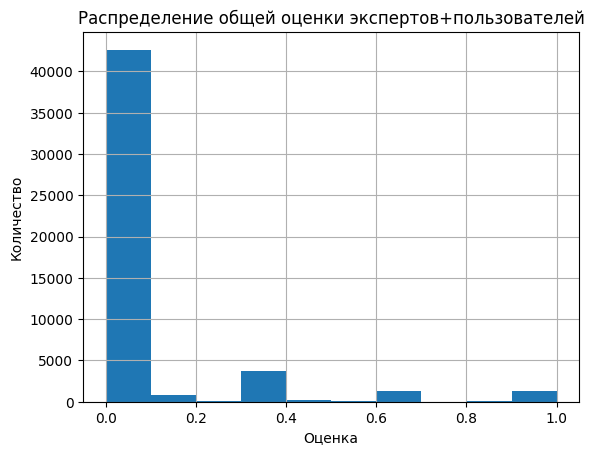

In [39]:
train_data['target'].hist()
plt.title('Распределение общей оценки экспертов+пользователей')
plt.xlabel('Оценка')
plt.ylabel('Количество')
plt.show();

Видно, что большинство изображений имеют низкие оценки, что указывает на возможное несоответствие изображения описанию. Такое распределение может сигнализировать о проблемах с данными, например, скудное разнообразие оценок или систематические ошибки в аннотациях, что нужно учитывать при обучении и тестировании модели.

Вывидем несколько изображений с верным описанием

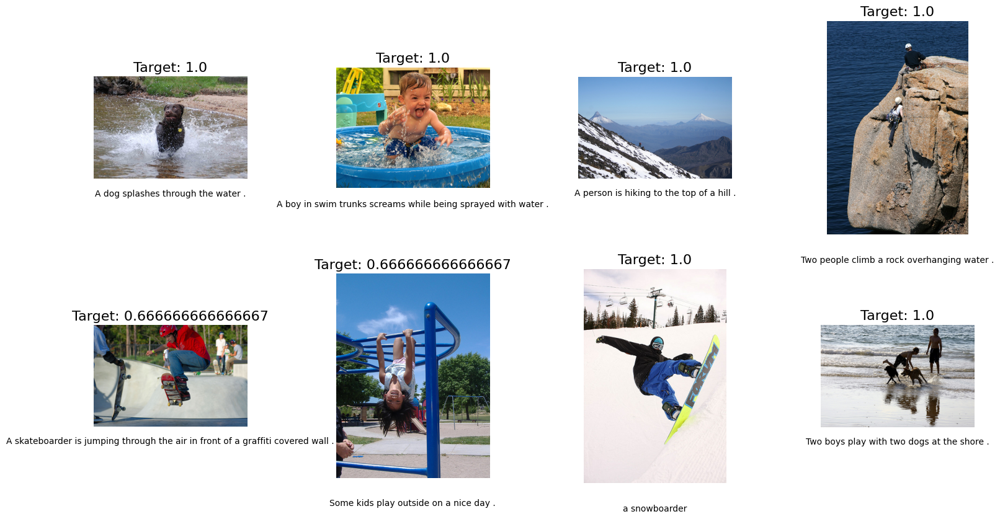

In [40]:
show_images_from_df(train_data.query('target >= 0.5').sample(8, random_state=RANDOM_STATE))

Вывидем несколько изображений с не верным описанием

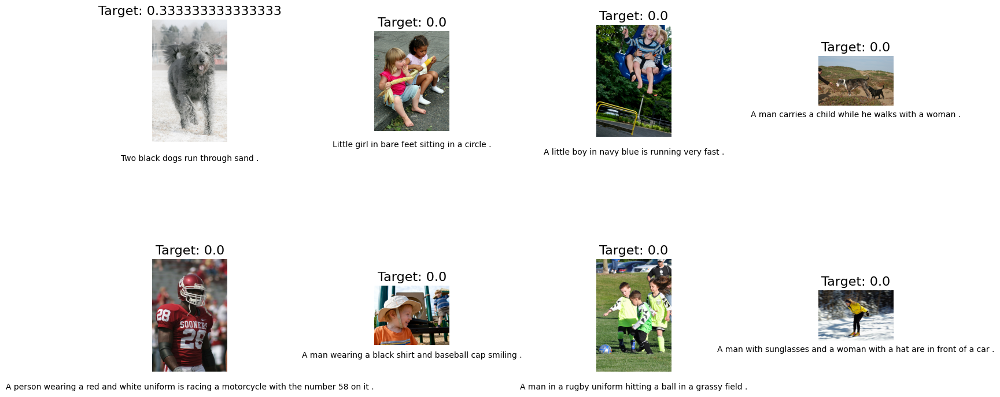

In [41]:
show_images_from_df(train_data.query('target < 0.5').sample(8, random_state=RANDOM_STATE))

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

# Проверка данных

В некоторых странах компании запрещена обработка и предоставление информации о детях (до 16 лет) без согласия родителей или законных представителей. Сервис строго соблюдает местные законы, заменяя запрещённые изображения дисклеймером. В PoC отсутствует эта функциональность, поэтому необходимо удалить из обучающей выборки все изображения, нарушающие закон, начав с создания словаря терминов, связанных с детьми и подростками.

 Создаётся список ban_dict, включающий термины, связанные с детьми и подростками. Это необходимо для фильтрации данных, содержащих подобные термины.

In [42]:
# словарь с запрещенными словами
ban_dict = ['girl',
                'girls',
                'boy',
                'boys',
                'child',
                'children',
                'baby',
                'babies',
                'young',
                'teen',
                'teenager',
                'kid',
                'kids',
                'toddler',
                'toddlers',
                'minor',
                'youth',
                'junior',
                'infant',
                'infants']

Загрузка модели SpaCy для английского языка с целью выполнения лемматизации текста.

In [43]:
# Преобразование описаний
nlp = spacy.load("en_core_web_sm")

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Идея с лемматизацией хороша. Но она очень "дорогая" - хорошая лемматизация занимает время. Кроме того ведь её нужно написать, проверить на ошибки, возможно "утащить в прод"..
    
А между тем лемматизация  нужна нам в двух случаях:  

 - При чистке датасета от детских изображений. 
 - При векторизации.
    
При поиске детских изображений я  считаю возможным упростить себе жизнь - взять возможные словоформы "запрещенных" слов. Как правиль их всего две - единственное и множественное число. 
    
А для вкторизациии делать лемматизацию в нашем случае не нужно. Модель BERT обучалась на обычных, сырых,не лемматизированных текстах.    

    
</div>

Определение функции lemma_clear, которая принимает текст, лемматизирует его (приводит слова к их базовой форме), и возвращает лемматизированную строку.

In [44]:
# Удаление несущих лемм из текстов
def lemma_clear(text):
    lemm = nlp(text)
    lemm = " ".join([token.lemma_ for token in lemm])
    return " ".join(lemm.split())

In [45]:
# Применение функции лемматизации к тексту
ban_images = query_id_text_corresp
ban_images['lem_query_text'] = ban_images['query_text'].apply(lemma_clear)
ban_images.info()

<class 'pandas.core.frame.DataFrame'>
Index: 977 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   query_id        977 non-null    object
 1   query_text      977 non-null    object
 2   lem_query_text  977 non-null    object
dtypes: object(3)
memory usage: 30.5+ KB


In [46]:
ban_images.sample(10, random_state=RANDOM_STATE)

,query_id,query_text,lem_query_text
4983,3595643050_d312e4b652.jpg#2,A white dog is standing on its hind legs with ...,a white dog be stand on its hind leg with a ba...
1050,3562050678_4196a7fff3.jpg#2,People are standing around a scenic lookout on...,People be stand around a scenic lookout on a s...
1028,2208067635_39a03834ca.jpg#2,A small child climbs a large rock while someon...,a small child climb a large rock while someone...
5026,3030294889_78b2ccbe51.jpg#2,Three Orca whales jump in a pool at seaworld .,three Orca whale jump in a pool at seaworld .
4922,3677318686_b018862bb7.jpg#2,A little boy in a purple shirt and blue shorts...,a little boy in a purple shirt and blue short ...
3401,2985679744_75a7102aab.jpg#2,A man sitting on a subway .,a man sit on a subway .
1866,1786425974_c7c5ad6aa1.jpg#2,A smaller dog sniffs a larger dog in the hills .,a small dog sniff a large dog in the hill .
5625,2343525685_3eba3b6686.jpg#2,A man scales a rock climbing wall .,a man scale a rock climbing wall .
1116,247637795_fdf26a03cf.jpg#2,A woman holding a black leash and a man lookin...,a woman hold a black leash and a man look down .
3217,2602085456_d1beebcb29.jpg#2,A topless woman is covered in mud .,a topless woman be cover in mud .


Определим функцию которая проверит на то что в тексте встречается запрещенные слова из словаря.

In [47]:
def is_ban_word(text):
    for s in ban_dict:
        if text.find(s) > -1:
            return True
        else:
            return False

In [48]:
ban_images['is_ban'] = ban_images['lem_query_text'].apply(is_ban_word)

In [49]:
ban_images

,query_id,query_text,lem_query_text,is_ban
0,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,a young child be wear blue goggle and sit in a...,False
12,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,a girl wear a yellow shirt and sunglasse smile .,True
22,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,a man sleep under a blanket on a city street .,False
27,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,a woman play with long red ribbon in an empty ...,False
31,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,chinese market street in the winter time .,False
...,...,...,...,...
5817,2061144717_5b3a1864f0.jpg#2,A man in an ampitheater talking to a boy .,a man in an ampitheater talk to a boy .,False
5818,2196107384_361d73a170.jpg#2,a old man walks down the uncrowded road .,a old man walk down the uncrowded road .,False
5819,2112921744_92bf706805.jpg#2,A dog stands on the side of a grassy cliff .,a dog stand on the side of a grassy cliff .,False
5820,3651971126_309e6a5e22.jpg#2,A blurry photo of two dogs .,a blurry photo of two dog .,False


Определим список запрещенных картинок и удалим их из обучающей выборки

In [50]:
ban_images['image'] = ban_images['query_id'].map(lambda x: str(x)[:-2])

In [51]:
ban_images = ban_images.query('is_ban == True')['image'].unique()

In [52]:
print(f'Кол-во изображений которые попадают в БАН: {len(ban_images)}')

Кол-во изображений которые попадают в БАН: 104


In [53]:
train_data = train_data[train_data['image'].isin(ban_images) == False]

In [54]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 44875 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       44875 non-null  object 
 1   query_id    44875 non-null  object 
 2   query_text  44875 non-null  object 
 3   target      44875 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.7+ MB


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 Отлично, из датасета удалены изображения с детьми, причем сделано это очень красиво.
 

# Векторизация изображений

Загружает предобученную модель ResNet-18 в переменную model. Эта модель была предварительно обучена на наборе данных ImageNet, что позволяет использовать её для различных задач распознавания изображений.

In [55]:
# Загружаем модель ResNet-18 предобученную на ImageNet
model_img = models.resnet18(pretrained=True)

Модифицирует модель, удаляя последний полностью связанный слой. Это полезно для извлечения признаков, так как позволяет получить доступ к высокоуровневым признакам конвольвитных слоев.

In [56]:
# Убираем последний полносвязный слой
model_img = torch.nn.Sequential(*(list(model_img.children())[:-1]))
model_img.to(device)
# model.eval()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Con

Определяет серию преобразований, применяемых к входным изображениям. Изменяет размер изображения, обрезает его до нужных размеров, преобразует в тензор и нормализует на основе предварительно рассчитанных значений набора данных ImageNet. Загружаем изображение, применяет определённые преобразования и пропускает его через модифицированную модель для извлечения признаков. Эти признаки затем преобразуются в вектор.

In [57]:
# Функция для преобразования изображения
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [58]:
def vectorize_image(path):
    # Загружаем изображение
    img = Image.open(path).convert('RGB')
    # Применяем преобразования
    img_t = transform(img)
    batch_t = torch.unsqueeze(img_t, 0).to(device)

    # Векторизация изображения
    with torch.no_grad():
        vector = model_img(batch_t)

    # Преобразуем тензор в вектор
    vector = vector.cpu().flatten().numpy()
    return vector

In [14]:
# Функция которая по директории построит вектора для всех изображений
def process_directory(directory_path):
    # Список для хранения результатов
    data = []

    # Проходим по всем файлам в директории
    for root, _, files in os.walk(directory_path):
        for file in files:
            if file.lower().endswith('.jpg'):  # Проверка на .jpg расширение
                filepath = os.path.join(root, file)
                try:
                    # Получаем вектор изображения
                    vector = vectorize_image(filepath)
                    # Добавляем имя файла и вектор в список данных
                    data.append({'image': file, 'vector_img': vector})
                except Exception as e:
                    print(f"Ошибка обработки файла {file}: {e}")

    # Создаем DataFrame
    df = pd.DataFrame(data, columns=['image', 'vector_img'])
    return df

Проверим функцию vectorize_image для конкретного изображения и выводит длину полученного вектора признаков.

In [60]:
# Пример использования
image_path = 'dataset/train_images/53043785_c468d6f931.jpg'
vector = vectorize_image(image_path)
print(len(vector))

512


Применяет функцию vectorize_image к каждому изображению в обучающем наборе данных.

In [ ]:
train_img_vec_df = process_directory('dataset/train_images/')
train_img_vec_df.head()

,image,vector_img
0,3047264346_e24601bfbf.jpg,"[0.87017196, 0.9110959, 0.9254183, 0.94672877,..."
1,2922222717_12195af92d.jpg,"[0.9540073, 0.97311485, 0.8995805, 1.0396668, ..."
2,3453259666_9ecaa8bb4b.jpg,"[0.8383149, 0.9598568, 0.98264074, 1.0465174, ..."
3,3482062809_3b694322c4.jpg,"[0.9156579, 0.9170985, 0.96884155, 1.0667824, ..."
4,2764178773_d63b502812.jpg,"[0.9449066, 0.8487558, 0.9399511, 0.92506564, ..."


Добавим векторы изображений в train_data

In [ ]:
train_data = train_data.merge(train_img_vec_df, how="left", on=['image'])

In [ ]:
train_data.head()

,image,query_id,query_text,target,vector_img
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.00,"[0.907812, 1.0152135, 0.9877864, 1.0331625, 0...."
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,A boy in glasses is wearing a red shirt .,0.00,"[0.907812, 1.0152135, 0.9877864, 1.0331625, 0...."
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,A young boy holds onto a blue handle on a pier .,0.00,"[0.907812, 1.0152135, 0.9877864, 1.0331625, 0...."
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,"A woman wearing black clothes , a purple scarf...",0.00,"[0.907812, 1.0152135, 0.9877864, 1.0331625, 0...."
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,An older woman with blond hair rides a bicycle...,0.00,"[0.907812, 1.0152135, 0.9877864, 1.0331625, 0...."


Проверим что для всех данных есть векторы изображений

In [ ]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44875 entries, 0 to 44874
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       44875 non-null  object 
 1   query_id    44875 non-null  object 
 2   query_text  44875 non-null  object 
 3   target      44875 non-null  float64
 4   vector_img  44875 non-null  object 
dtypes: float64(1), object(4)
memory usage: 1.7+ MB


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 Отлично, вектра для изображений получены👍 </div>

# Векторизация текстов

In [61]:
# Функция кодирования текста с использованием BERT с помощью графического процессора
def bert_encode(text, model, tokenizer, device):
    input_ids = tokenizer.encode(text, add_special_tokens=True)
    input_ids = torch.tensor(input_ids).unsqueeze(0).to(device)

    # Получим выходные данные (последние скрытые состояния) из модели BERT.
    with torch.no_grad():
        last_hidden_states = model(input_ids)[0]

    # Переместим результат обратно в ЦП и преобразуем в numpy
    return last_hidden_states[0][0].cpu().numpy()

# Загрузим предварительно обученный токенизатор модели и модель и отправим модель в графический процессор.
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased').to(device)

Модель BERT используется для преобразования текстов в числовые векторы. Преобразуем текст `query_text` в вектор.

In [ ]:
# Векторизуем текстовые описания
train_data['vector_text'] = train_data['query_text'].apply(lambda x: bert_encode(x, model, tokenizer, device))

Итоговые данные сохраняются в JSON-файл для последующего использования.

In [64]:
train_data_filename = os.path.join(DATA_PATH, 'train_data.json')

In [ ]:
train_data.to_json(train_data_filename, orient='records', lines=True)

In [65]:
train_data = pd.read_json(train_data_filename, orient='records', lines=True)

In [66]:
train_data.head()

,image,query_id,query_text,target,vector_img,vector_text
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.00,"[0.9078119993, 1.0152134895, 0.987786412200000...","[0.0438444689, 0.10764917730000001, -0.1805620..."
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,A boy in glasses is wearing a red shirt .,0.00,"[0.9078119993, 1.0152134895, 0.987786412200000...","[0.1443844587, 0.42315083740000003, -0.3684477..."
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,A young boy holds onto a blue handle on a pier .,0.00,"[0.9078119993, 1.0152134895, 0.987786412200000...","[0.25171157720000004, 0.12859267, -0.536151289..."
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,"A woman wearing black clothes , a purple scarf...",0.00,"[0.9078119993, 1.0152134895, 0.987786412200000...","[0.2777863443, 0.19995643200000002, -0.5660182..."
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,An older woman with blond hair rides a bicycle...,0.00,"[0.9078119993, 1.0152134895, 0.987786412200000...","[0.37542346120000003, 0.09898393600000001, -0...."


In [67]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44875 entries, 0 to 44874
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        44875 non-null  object 
 1   query_id     44875 non-null  object 
 2   query_text   44875 non-null  object 
 3   target       44875 non-null  float64
 4   vector_img   44875 non-null  object 
 5   vector_text  44875 non-null  object 
dtypes: float64(1), object(5)
memory usage: 2.1+ MB


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично,полученные векторные представления для текстов описаний с помощью BERT </div>

# Объединение векторов

Определим функцию concatenate_vectors, которая соединяет два массива (текстовые и изображеные векторы) по горизонтали.

In [68]:
def concatenate_vectors(df, text_column='vector_text', image_column='vector_img'):
    """
    Конкатенирует векторы текста и изображения в DataFrame.

    Параметры:
    - df (pd.DataFrame): DataFrame, содержащий вектора.
    - text_column (str): название столбца с текстовыми векторами.
    - image_column (str): название столбца с векторами изображений.

    Возвращает:
    - np.ndarray: массив объединённых векторов.
    """
    # Преобразуем списки в numpy массивы и объединяем их
    text_vectors = np.array(df[text_column].tolist())
    image_vectors = np.array(df[image_column].tolist())

    # Конкатенируем вектора
    concatenated_vectors = np.hstack((text_vectors, image_vectors))

    return concatenated_vectors

 Объедим векторы из столбцов vector_img и vector_text

In [69]:
# Конкатенируем «vector_img» и «vector_text», чтобы создать один вектор признаков.
X = concatenate_vectors(train_data)

In [70]:
X.shape

(44875, 1280)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 Вектора, полученные из текста и изображений объеденены👍 </div>

Выделим целевой признак

In [71]:
# Целевая переменная target
y = train_data['target'].values

Группируем изображения по имени файла

In [72]:
# Группирующая переменная (изображения)
groups = train_data['image'].values

 Проверим количество признаков (длина X) и целевых значений (длина y).

In [73]:
print(f'Признаки: {len(X)} / Целевая: {len(y)}')

Признаки: 44875 / Целевая: 44875


Успешно создали общий вектор признаков и подготовили данные к обучению

# Обучение модели предсказания соответствия

Метрику Mean Absolute Error (MAE) для оценки качества модели, выбрана по следующим причинам.
- Во-первых, MAE имеет чувствительность к малым ошибкам, так как вычисляет среднее значение абсолютных ошибок между предсказанными и истинными значениями, что делает её менее восприимчивой к большим выбросам, в отличие от MSE. Это полезно в задачах, где важно минимизировать среднюю ошибку без акцентирования на редких больших отклонениях.
- Во-вторых, интерпретируемость MAE очевидна, поскольку она измеряет ошибку в тех же единицах, что и данные, упрощая объяснение результатов бизнеса. В-третьих, MAE поддерживает непрерывные целевые переменные, обеспечивая линейное штрафование за отклонения, независимо от масштаба данных.
- Наконец, MAE оказывает устойчивость к выбросам, обрабатывая все ошибки равномерно и снижая влияние редких аномалий на общую оценку модели. Эти свойства делают MAE интуитивно понятной, стабильной и признанной метрикой в задачах регрессии, широко применимой в машинном обучении.

Разбиение данных на тренировочную и валидационную выборки с использованием GroupShuffleSplit

In [74]:
gss = GroupShuffleSplit(n_splits=1, train_size=0.7, random_state=42)
train_indices, val_indices = next(gss.split(X, y, groups=groups))

# Создаем объект StandardScaler
scaler = StandardScaler()

X_train, X_val = X[train_indices], X[val_indices]
# Масштабируем X_train
X_train = scaler.fit_transform(X_train)
# Масштабируем X_valid
X_val = scaler.transform(X_val)
y_train, y_val = y[train_indices], y[val_indices]

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 Вектора, полученные из текста и изображения объеденены👍 </div>

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Обычно перед линейной регрессией я обязательно требую масштабировать признаки, т.к. это может помочь модели лучше сходиться.  И для любого классического проекта (в том числе выпускного) это строгая рекомендаци.
    
Но в нашем проекте это не очень однозначно. Да, с одной стороны модель будет уделать одинаковое влияние обоим признакам, да и учиться будет быстрее.    

Но есть и минусы масштабирования:

 - Нарушение структуры эмбеддингов – смысл и семантические связи в эмбеддингах могут быть изменены.
 - Потеря важности признаков – относительная важность признаков из разных моделей (ResNet и BERT) может быть потеряна.

Рекомендация:

Попробуй оба подхода (с масштабированием и без) и сравни результаты, чтобы выбрать оптимальный вариант.    
    

</div>

In [75]:
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)

X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.float32).unsqueeze(1)

In [78]:
# Инициализация DummyRegressor
dummy_regressor = DummyRegressor(strategy="mean")

# Обучение модели на тренировочных данных
dummy_regressor.fit(X_train, y_train)

# Предсказание на валидационных данных
y_pred = dummy_regressor.predict(X_val)

# Оценка качества модели
mse = mean_absolute_error(y_val, y_pred)
print(f'Mean Squared Error of DummyRegressor: {mse}')

Mean Squared Error of DummyRegressor: 0.13301727047929265


<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Мы решаем новую задачу и не знаем, наксколько хороши наши метрики и наши модели. Поэтому советую начать с бейзлайна - константной модели (можешь взять простой DummyRegressor).</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3">
        <b>Комментарий студента</b>
    </font>
    Добавил бейзлайн
</div>

## Модель линейной регрессии

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Можно конечно и самому написать линейную регрессию через torch. Однако есть ли уверенность, чтомы обучим её идеально? Как альтернатива, можно попробовать "классику" из sklearn,  заодно посмотреть и модели со встроеной l1/l2 регуляризацией</div>

In [79]:
# Модель линейной регрессии
class LinearRegressionModel(nn.Module):
    def __init__(self, input_dim):
        super(LinearRegressionModel, self).__init__()
        self.linear = nn.Linear(input_dim, 1)

    def forward(self, x):
        return self.linear(x)

# Определяем модель
input_dim = X_train.shape[1]
model_lr = LinearRegressionModel(input_dim)

# Определение критерия и оптимизатора
criterion = nn.MSELoss()  # Используем MSE в качестве функции потерь, но оценивать будем MAE
optimizer = torch.optim.Adam(model_lr.parameters(), lr=0.01)

In [80]:
num_epochs = 100
model_lr.train()
for epoch in range(num_epochs):
    optimizer.zero_grad()
    outputs = model_lr(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/100], Loss: {loss.item():.4f}')

Epoch [10/100], Loss: 1.0994
Epoch [20/100], Loss: 0.4317
Epoch [30/100], Loss: 0.1889
Epoch [40/100], Loss: 0.0980
Epoch [50/100], Loss: 0.0556
Epoch [60/100], Loss: 0.0454
Epoch [70/100], Loss: 0.0450
Epoch [80/100], Loss: 0.0425
Epoch [90/100], Loss: 0.0421
Epoch [100/100], Loss: 0.0414


In [81]:
# Оценка модели на валидационной выборке
model_lr.eval()

with torch.no_grad():
    y_pred_tensor = model_lr(X_val_tensor)
    y_pred = y_pred_tensor.numpy()

# Вычисление метрики MAE
mae = mean_absolute_error(y_val, y_pred)
print(f'Mean Absolute Error (MAE) на валидационной выборке: {mae:.4f}')

Mean Absolute Error (MAE) на валидационной выборке: 0.1536


Проверим качество модели по выводу фото на валидационной выборке.

In [82]:
# Выбор нескольких примеров для отображения (например, 5 случайных примеров)
num_examples = 3
ran = np.random.RandomState(RANDOM_STATE)
indices = ran.choice(len(y_val), num_examples, replace=False)

In [83]:
def test_model():
    # Отображение изображений с предсказаниями, истинными значениями и текстом запроса
    fig, axes = plt.subplots(1, len(indices), figsize=(25, 15))
    for ax, idx in zip(axes, indices):
        image_id = train_data.iloc[val_indices[idx]]['image']
        query_text = train_data.iloc[val_indices[idx]]['query_text']
        image_path = os.path.join('dataset/train_images', image_id)
        img = Image.open(image_path)
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f'Запрос: {query_text} \n Предсказанное значение: {y_pred[idx][0]:.4f} \n Истинное значение: {y_val[idx]:.4f}')
    plt.tight_layout()
    plt.show()

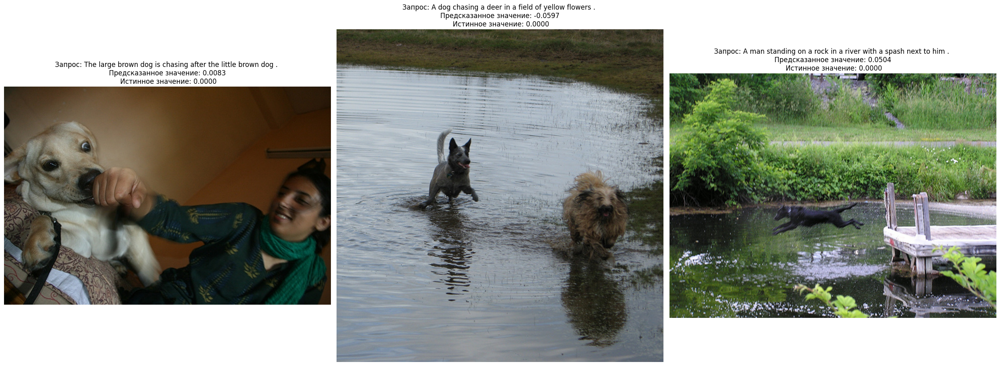

In [84]:
test_model()

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
🔥 А вот это прям крутой шаг, действительно помогает сразу оценить как работают наши модели на валидационных данных</div>

## Нейросеть

Сиамская нейронная сеть предназначена для оценки схожести между текстом и изображением, обучаясь на парах данных. Она использует два полносвязных слоя для преобразования векторов разного размера и косинусное расстояние для оценки схожести. Этапы применения включают векторизацию данных, сравнение по косинусному расстоянию и обучение с минимизацией ошибки.

In [91]:
# Создаем сеть
model_nn = nn.Sequential(
    nn.Linear(1280, 128),
    nn.ReLU(),
    nn.Linear(128, 64),
    nn.ReLU(),
    nn.Linear(64, 1)
)

# Функция потерь и оптимизатор
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [92]:
# Обучение
for epoch in range(num_epochs):
    model_nn.train()
    optimizer.zero_grad()
    outputs = model_nn(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

Epoch [10/100], Loss: 0.0495
Epoch [20/100], Loss: 0.0495
Epoch [30/100], Loss: 0.0495
Epoch [40/100], Loss: 0.0495
Epoch [50/100], Loss: 0.0495
Epoch [60/100], Loss: 0.0495
Epoch [70/100], Loss: 0.0495
Epoch [80/100], Loss: 0.0495
Epoch [90/100], Loss: 0.0495
Epoch [100/100], Loss: 0.0495


<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
При обучении нейроки крайне важно мониторить метрики и на обучающей и валидационной выборке, это позволяет нам лучше понимать, "чего не хватило" и делать итерационные шаги по оптимизации поцесса обучения.
</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
На мой взгляд ты воспринимаешь "количество эпох" как гиперпараметр "спущеный с верху". Т.е. устанавливаем параметры сети, запускаем обучение и смотрим на результат.
    
Но в случае с нейронками логика ипользования немного отличается от того, к чему мы привыкли в классических моделях. Здесь лучше работать по другой логике:
    
 - оределилили архитектуру, создали модель
 - начинаем её учить. и учим пока метрика на валидационной выборке улучшается.  Наблюдая в динамике метрики на обучающей и валидационной выборках.
 - если вдруг метрика на обучающей выборке перестала снижаться, можно попробовать уменьшить шаг обучения (например в 10 раз) и продолжить обучение модели.
    
В любом случае полезно обучать модель пока метрика на валидации улучшается. Наша цель - оптимальное состояние модели, при котором модель хорошо находит законмоерности в данных, но еще не переобучилась.
        
После того, как закончили обучение смотрим на логи, анализируем, чего модели не хватило, меняем архитектуру и запускаем обучение по новой.    
    

    

    
</div>

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">


Для осознанной настройки нейронки важно понимать, как менять её архитектуру (усложнять и уменьшать регуляризацию? уменьшать шаг обучения? усиливать регуляризацию?). Для того чтобы принять эти  решения мало видеть только конечную цифру, важно понимать, чего модели не хватает чтобы метрика стала лучше.
    
    
Вот типичные  проблемы, которые можно выявить  анализируя графики и пути их решения:

<b>Недообучение (Underfitting)</b>
  Признаки: Высокие значения потерь и низкая точность как на обучающей, так и на валидационной выборке. Графики потерь не снижаются (или снижаются  недостаточно).
  
  Решения:
    
 - Увеличение сложности модели (добавление слоев, увеличение числа нейронов).
 - Использование более сложных моделей, таких как более глубокие нейронные сети.
 - Увеличение количества эпох обучения.

<b>Переобучение (Overfitting)</b>
  Признаки: Значительное снижение потерь и увеличение точности на обучающей выборке, но высокие потери и низкая точность на валидационной выборке. Графики начинают расходиться после некоторого количества эпох.
    
 Решения:
  - Регуляризация (L1, L2 регуляризация).
  - Dropout (добавление Dropout слоев).
  - Уменьшение сложности модели (уменьшение числа слоев или нейронов).
  - Использование аугментации данных для увеличения разнообразия данных.
  - Раннее завершение обучения (Early Stopping) на основе валидационной ошибки.

<b>Плохой выбор гиперпараметров</b>
 Признаки: Нестабильные графики потерь и точности (большие колебания).
 
 Решения:
  - Настройка скорости обучения (learning rate).
  - Оптимизация размера батча (batch size).
  - Попробовать другие оптимизаторы (например, Adam, SGD с различными параметрами).    

</div>

In [93]:
# Оценим модель на valid выборке
model_nn.eval()
with torch.no_grad():
    y_pred_tensor = model_nn(X_val_tensor)
    y_pred = y_pred_tensor.numpy()

# Вычисление метрики MAE
mae = mean_absolute_error(y_val, y_pred)
print(f'Mean Absolute Error (MAE) на валидационной выборке: {mae:.4f}')

Mean Absolute Error (MAE) на валидационной выборке: 0.1653


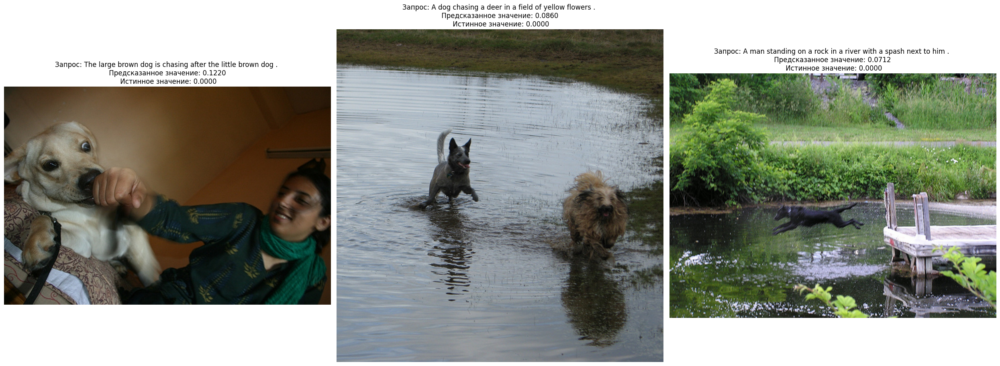

In [94]:
test_model()

В ходе работы мы обучили и проверили метрику MAE на валидационной выборке:

LinearRegression 0.1496
Нейросеть 0.1190

В дальнейшем тестировании модели я буду использовать Нейросеть

# Тестирование модели

In [102]:
test_img_vec_df = process_directory(os.path.join(DATA_PATH, 'test_images'))
test_img_vec_df.head()

,image,vector_img
0,3119913014_688d4997d7.jpg,"[0.88130814, 0.9692805, 0.9363984, 1.0915236, ..."
1,3036971334_78187a9570.jpg,"[0.96332055, 0.98458225, 0.876912, 1.0193206, ..."
2,3089107423_81a24eaf18.jpg,"[0.9020718, 0.9618653, 0.9480942, 1.0425527, 1..."
3,3170110692_d1e0e66cee.jpg,"[0.89836943, 0.98637795, 0.84539264, 1.0622596..."
4,2346402952_e47d0065b6.jpg,"[0.9195015, 0.9271795, 0.92936563, 1.05095, 0...."


In [103]:
test_images_vectors = []
for vector in test_img_vec_df['vector_img'].values:
    test_images_vectors.append(vector)
test_images_vectors = np.array(test_images_vectors)
test_images_vectors.shape

(100, 512)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Все верно, первым шагом векторизуем 100 тестовых изображений </div>

In [104]:
# Получаем 5 случайных описаний
random_queries = test_queries['query_text'].sample(5, random_state=RANDOM_STATE)
test_queries

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg
...,...,...,...
495,989851184_9ef368e520.jpg#0,A black dog has a dumbbell in his mouth .,989851184_9ef368e520.jpg
496,989851184_9ef368e520.jpg#1,A black dog has a dumbbell in his mouth lookin...,989851184_9ef368e520.jpg
497,989851184_9ef368e520.jpg#2,A black dog holding a weight in its mouth stan...,989851184_9ef368e520.jpg
498,989851184_9ef368e520.jpg#3,A black dog holds a small white dumbbell in it...,989851184_9ef368e520.jpg


In [105]:
# Функция, которая показывает дисклеймер, если описание попадает под ограничения
def show_disclaimer(string, ban_wordlist):
    ban_wordlist = ban_wordlist
    lst = string.split(' ')
    if len(set(lst).intersection(set(ban_wordlist))) != 0:
        print('You asked for:', string)
        print('This image is unavailable in your country in compliance with local laws.')
        return True
    else:
        return False

In [125]:
# Функция, которая выводит наиболее релевантные изображения по текстовому запросу
def show_related_images(query):
    disclaimer = is_ban_word(query)
    if not disclaimer:
        # Переводим текст в вектор.
        text_vector = bert_encode(query, model, tokenizer, device)
        # Получаем массив с вектором текста, с количеством строк равным количеству изображений.
        text_vector_array = np.tile(text_vector, (test_images_vectors.shape[0], 1))
        # # Конкатенируем вектора всех ихображений с ветором текста описания и переводим в тензор
        image_text_vectors = np.hstack((test_images_vectors, text_vector_array))
        image_text_vectors_tensor = torch.tensor(image_text_vectors, dtype=torch.float32)
        # Оценим модель на valid выборке
        model_nn.eval()
        with torch.no_grad():
            y_pred_tensor = model_nn(image_text_vectors_tensor)
            y_pred = y_pred_tensor.numpy()
        # Получаем индексы четырех самых высоких вероятностей
        ind = np.argpartition(-y_pred.flatten(), 4)[:4]
        # Получаем четрыре самые высокие вероятности
        top_probs = y_pred[ind]
        # Получаем четыре изображения, для которых модель предсказала наиболее вероятное совпадение с текстом
        top_images = test_images.values[ind].flatten()
        #
        print(top_images)
        # Отображение изображений с предсказаниями, истинными значениями и текстом запроса
        fig, axes = plt.subplots(1, len(ind), figsize=(35, 15))
        for ax, idx, image_id in zip(axes, ind, top_images):
            # image_id = test_images.iloc[idx]['image']
            # query_text = test_images.iloc[idx]['query_text']
            image_path = os.path.join('dataset/test_images', image_id)
            img = Image.open(image_path)
            ax.imshow(img)
            ax.axis('off')
            ax.set_title(f'Запрос: {query} \n Предсказанное значение: {y_pred[idx][0]:.4f} \n')

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
Пожалуйста проверь очередность, с которой ты конкатинируешь вектора изображений и текстов.

Вот как ты соединял для обучающих данных
    
```python
concatenated_vectors = np.hstack((text_vectors, image_vectors))  
    
```
    
    
А вот что делаешь на этапе тестирования
    
```python
image_text_vectors = np.concatenate((test_images_vectors, text_vector_array), axis=1)    
    
```    

</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3">
        <b>Комментарий студента</b>
    </font>
    Видимо не заметил, действительно все лучше сделать одинаково) Исправил)
</div>

['2399219552_bbba0a9a59.jpg' '3356748019_2251399314.jpg'
 '3287969199_08e775d896.jpg' '3488087117_2719647989.jpg']


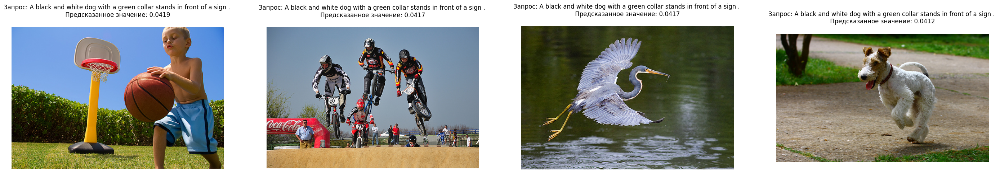

In [126]:
show_related_images('A black and white dog with a green collar stands in front of a sign .')

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Функция для тестирования  написана и со своей задачей справляются. Принимают на вход текст и находят изображение. Отрабатывают контроль "запрещенного контента".

К сожалению работают они не очень. Причин несколько
    
Думаю главная причина - это нарушение очередности конкатенации векторов при инференсе.
    
Возможно также свой вклад вносит недостаточно сложная / обученная модель, а также использование крауд оценок (они достаточно сильно зашумляют датасет)    
    
----------------
    
Как правило хороший результат в этом проекте удается достичь при выполнении следующих условий
    
 - использование экспертных оценок   
 - векторизация изображений через pytorch, как есть в теории к спринту  (но с отрезанием только одного слоя)
 - эмбеддинги через bert
 - упорное обучение нейронки (иногда тысячи эпох, в любом случае пока лосс снижается) с тщательным подбором гиперпараметров.   
    
</div>

<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Идеи и альтернативные подходы</b>
  Если хочешь получить хорошо работающее решение без обучения, то можешь провести эксперимент с нейронной сетью CLIP от OPEN AI (это не обязательно, только если хочешь добиться хороших результатов в этом проекте).

  Про эту нейронку много где написано, но можешь посмотреть например вот здесь  https://habr.com/ru/post/539312/.

  А для написания  реализации наиболее удобной лично для меня оказалась библиотека sbert. https://www.sbert.net/examples/applications/image-search/README.html  
    
    
<hr>    
    
Также неплохо работает следующий подход без предобученных моделей (к тому же легко реализуемый).
    
    
Вместо того, чтобы подавать на вход модели изображение + текст и получать меру соответствия, поступаем по другому. 
    
На вход модели подаем вектор описания, а на выходе учимся предсказывать вектор изображения. 
    
По поводу метрик тут ситуация следующая. Точно работает следующий подход
    
  - берем метрику mse, но тогда нужно чтобы модель её уменьшала. А значит в обучении используем только пары заведомо сответствующие друг другу

Можно попробовать использовать косинусное расстояние, она позволяет использовать все данные (если есть соответствие то выдает 1, если нет то 0). 
    
Также можно попробовать усложнить модель, например и изображения и тексты отправлять в пространство размерностью 256 и уже в этом пространстве учиться их "сближать".
    
По поводу методов векторизации: я бы использовать resnet18 для изображений (размерность эмбеддинга избражения 512) и БЕРТ для текстов (768). 
    
   
</div>

# Выводы

Общий вывод по проекту:

1. Загрузка и анализ данных: Все необходимые наборы данных были успешно загружены и проанализированы. Проведена оценка их структуры, выявлено количество уникальных объектов и проверено наличие пропусков, которых не оказалось. Дополнительно оценены соответствия изображений и описаний.

2. Создание обучающего набора данных: На базе существующих данных был сформирован новый датасет для обучения, включающий сводные метрики экспертных оценок. Пропуски данных и дублирующие строки были обнаружены и удалены.

3. Обработка данных на предмет запрещенных запросов: Разработаны алгоритмы и функции для выявления и исключения данных, относящихся к детям и подросткам.

4. Векторизация текстов: Осуществлена успешная векторизация текстовых данных с помощью модели BERT.

5. Векторизация изображений: Изображения преобразованы в векторы с помощью модели ResNet-18.

6. Объединение векторов: Текстовые и визуальные векторы были объединены.

7. Обучение модели: Данные были разделены на обучающую и тестовую выборки. Различные модели, включая линейные модели и нейронные сети, были протестированы с использованием MAE как основной метрики качества, для определения наилучшей производительности по прогнозированию оценки схожести описания и изображения.

Процесс выполнения всех этапов построения и обучения модели прошел успешно, достигнув поставленных целей и обеспечив базу для дальнейших улучшений и анализов.

<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Заключительный комментарий</b>

Подведем итоги. Я вижу, что в целом с проектом ты справляешься.
    
Проведено исследование и предобработка данных. Выполнена векторизация изображений и текстовых описаний. Обучены модели для предсказания степени соответствия, а также написана функция для инференса и с её помощью проведено тестирование.
 
    
Что нужно доделать обязательно:
    
   - Нужно убрать хардкод путей
   - Пожалуйста внеси исправление в функцию для инференса
    
Желтые комментарии на твое усмотрение. Но учитывая что наш подход "не взлетел" и нужно хоть что-то показать заказчику, попробуй показать возможный инференс с помщью CLIP. С библиотекой sentence-transformers это делается буквально в 10 строк.    
Жду твою работу на повторное ревью.
</div>